In [265]:
import pandas as pd
import numpy as np 
import json
import csv


import matplotlib.pyplot as plt
from matplotlib import rc
import seaborn as sns

from tqdm import tqdm_notebook as tqdm

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer 
import nltk
nltk.download('averaged_perceptron_tagger')

import spacy
import math

import string
import sys
import random

from collections import Counter
from itertools import chain

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/aarunku5/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [266]:
gwords=pd.read_csv("/Users/aarunku5/Desktop/DQI/DQI_Worker/data/SNLI/AFLITE_SPLIT/Final/Test/testgoodwords.csv")
df_testgood = pd.read_csv("/Users/aarunku5/Desktop/DQI/DQI_Worker/data/SNLI/AFLITE_SPLIT/Final/Test/testgood.csv")


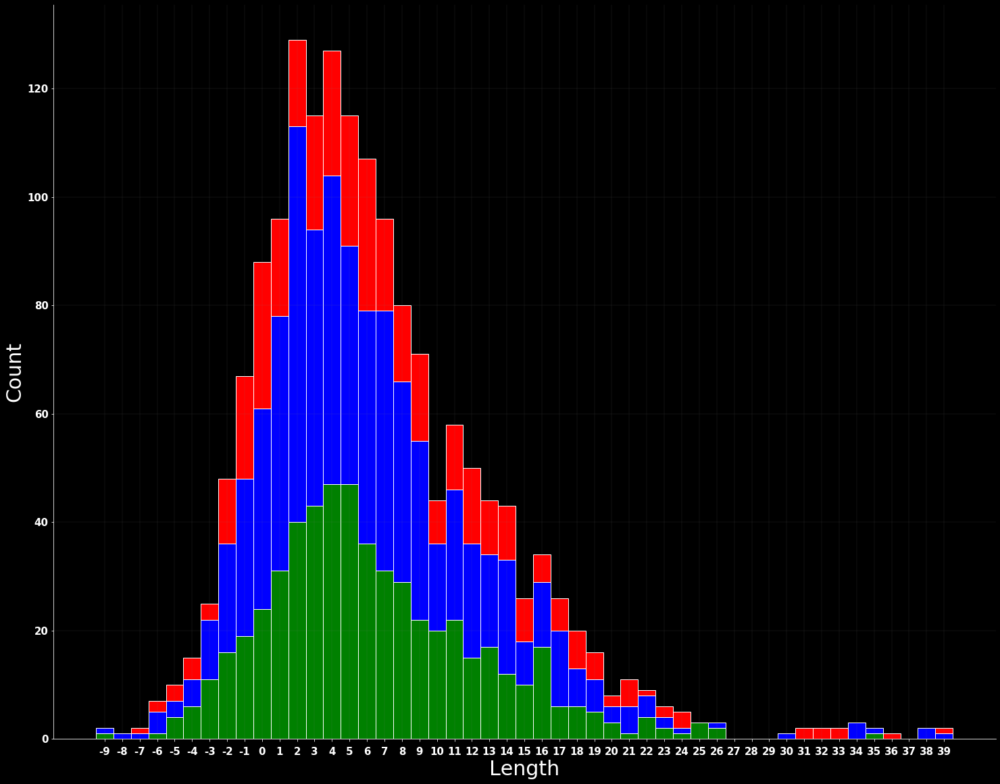

<Figure size 432x288 with 0 Axes>

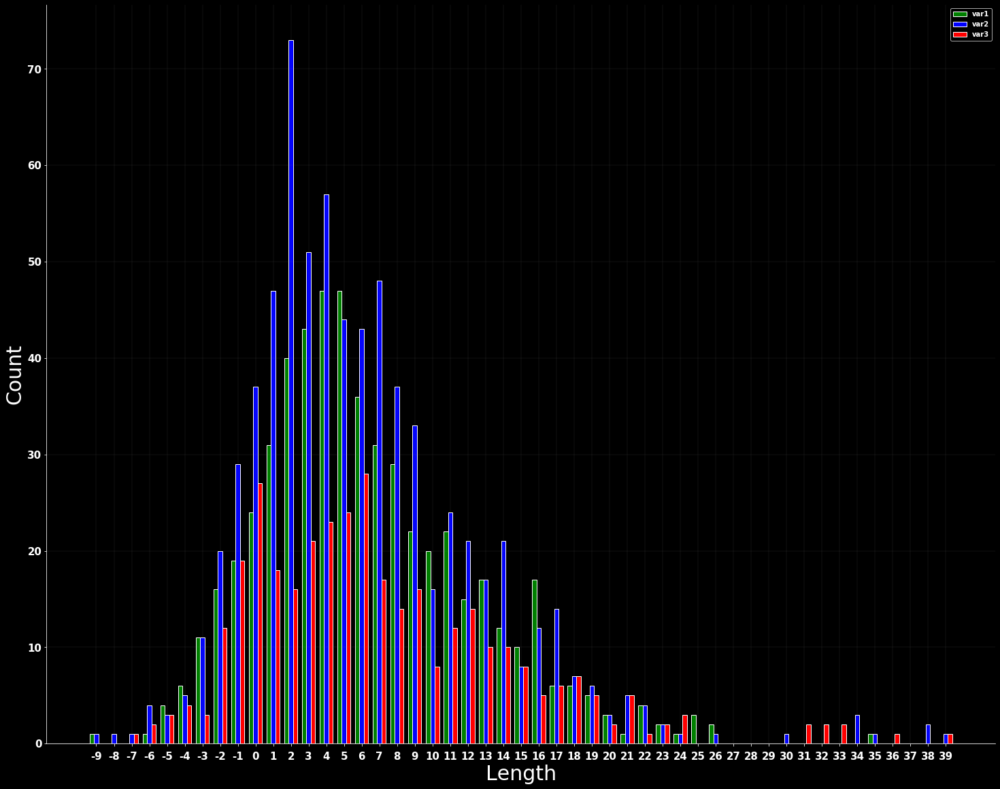

<Figure size 432x288 with 0 Axes>

In [268]:
#Length PH Good
lengthphg=[]
labelphg=[]
for i in range(1624):
    lengthphg.append(len(gwords.iloc[i]['fullnopunc'].split())-len(gwords.iloc[i+1624]['fullnopunc'].split()))
    labelphg.append(gwords.iloc[i]['label'])
x=[]
e=[]
n=[]
c=[]
for i in range(min(lengthphg),max(lengthphg)+1):
    x.append(i)
    e.append(0)
    n.append(0)
    c.append(0)
for i in range(len(x)):
    for j in range(len(lengthphg)):
        if(lengthphg[j]==x[i]):
            if(labelphg[j]=='entailment'):
                e[i]=e[i]+1
            elif(labelphg[j]=='neutral'):
                n[i]=n[i]+1
            else:
                c[i]=c[i]+1
rc('font', weight='bold')
bars1 = e
bars2 = n
bars3 = c
bars = np.add(bars1, bars2).tolist()
r = x
names = x
barWidth = 1
fig, ax = plt.subplots(figsize=(25,20))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Length',fontsize=30)
ax.set_ylabel('Count',fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.bar(r, bars1, color='green', edgecolor='white', width=barWidth)
ax.bar(r, bars2, bottom=bars1, color='blue', edgecolor='white', width=barWidth)
ax.bar(r, bars3, bottom=bars, color='red', edgecolor='white', width=barWidth)
plt.xticks(r, names, fontweight='bold')
plt.show()
plt.clf()

barWidth = 0.25 
bars1 = e
bars2 = n
bars3 = c
names=x
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
fig, ax = plt.subplots(figsize=(25,20))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Length',fontsize=30)
ax.set_ylabel('Count',fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.bar(r1, bars1, color='green', width=barWidth, edgecolor='white', label='var1')
ax.bar(r2, bars2, color='blue', width=barWidth, edgecolor='white', label='var2')
ax.bar(r3, bars3, color='red', width=barWidth, edgecolor='white', label='var3')
plt.xticks([r + barWidth for r in range(len(bars1))], names)
plt.legend()
plt.show()
plt.clf()



In [269]:
good=pd.DataFrame(columns=['sample','p','h','lengthph','label','onsc','onshc','onspc','onshpc','osc','oshc','ospc','oshpc'])
good['lengthph']=lengthphg
good['sample']=range(1624)
good['label']=labelphg
good['p']=gwords.iloc[0:1624]['fullnopunc']
hs=gwords.iloc[1624:3248]['fullnopunc']
hs=hs.reset_index()
hs
good['h']=hs['fullnopunc']
good

,sample,p,h,lengthph,label,onsc,onshc,onspc,onshpc,osc,oshc,ospc,oshpc
0,0,This church choir sings to the masses as they ...,The church has cracks in the ceiling,11,neutral,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,A woman with a green headscarf blue shirt and ...,The woman is very happy,8,entailment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,An old man with a package poses in front of an...,A man walks by an ad,6,contradiction,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,A land rover is being driven across a river,A Land Rover is splashing water as it crosses ...,-2,entailment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,A blond-haired doctor and her African american...,A doctor is studying,9,neutral,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1619,1619,A older man in a hat is playing a accordion on...,A busker is wearing a hat,12,neutral,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1620,1620,A boy drags his sled through the snow,a boy drags his dog,3,contradiction,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1621,1621,A man wearing glasses and a ragged costume is ...,A man with glasses and a disheveled outfit is ...,4,entailment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1622,1622,A female dancer wearing all white dancing whil...,A girl is dancing and anothe man take a photo,6,neutral,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


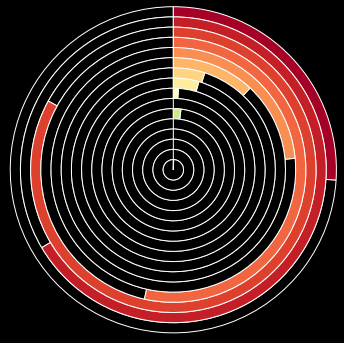

<Figure size 432x288 with 0 Axes>

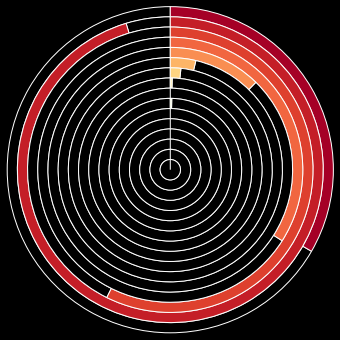

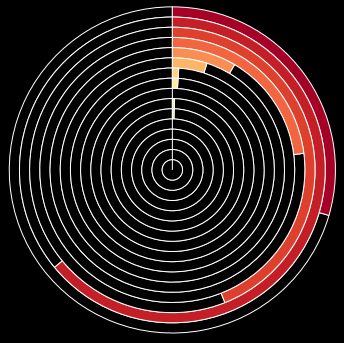

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:140: RuntimeWarning: Second argument 'y1' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


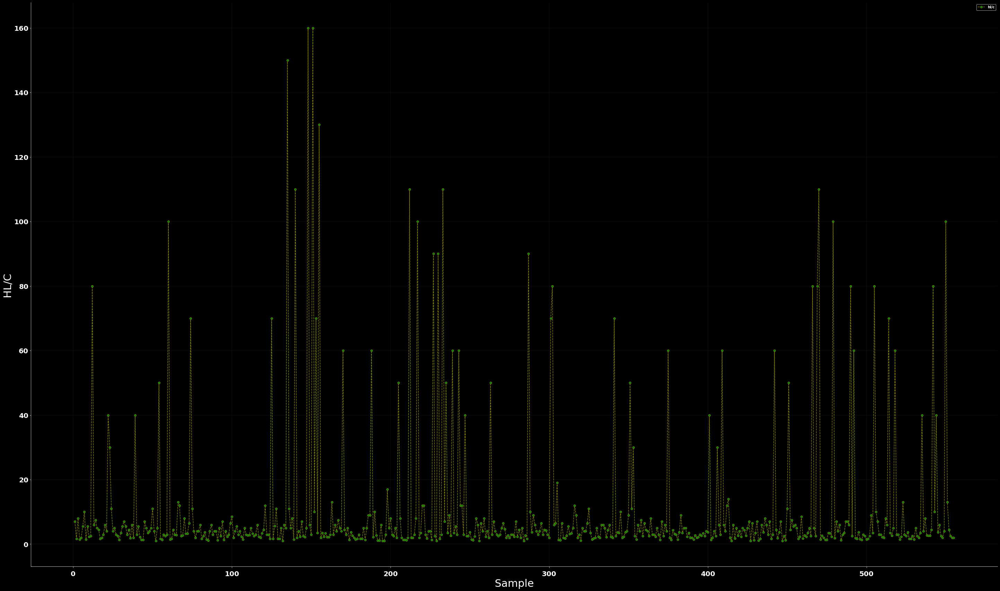

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:151: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

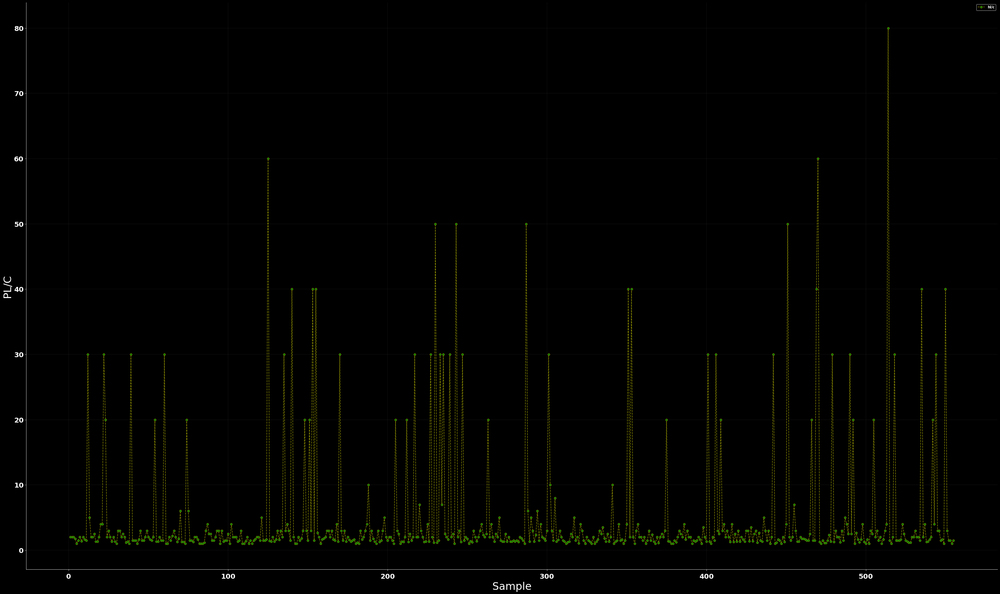

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:162: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

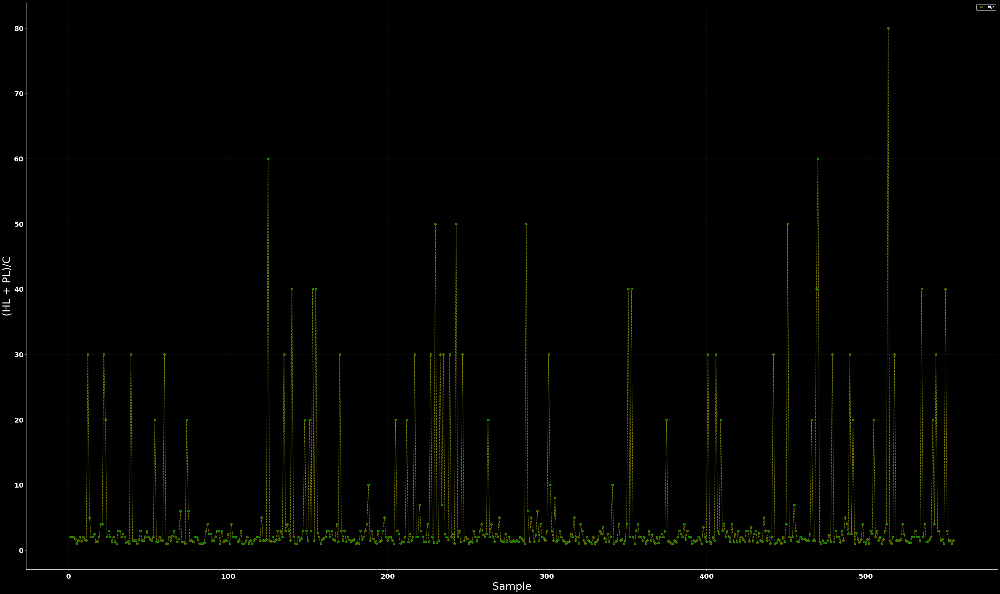

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:175: RuntimeWarning: Second argument 'y1' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

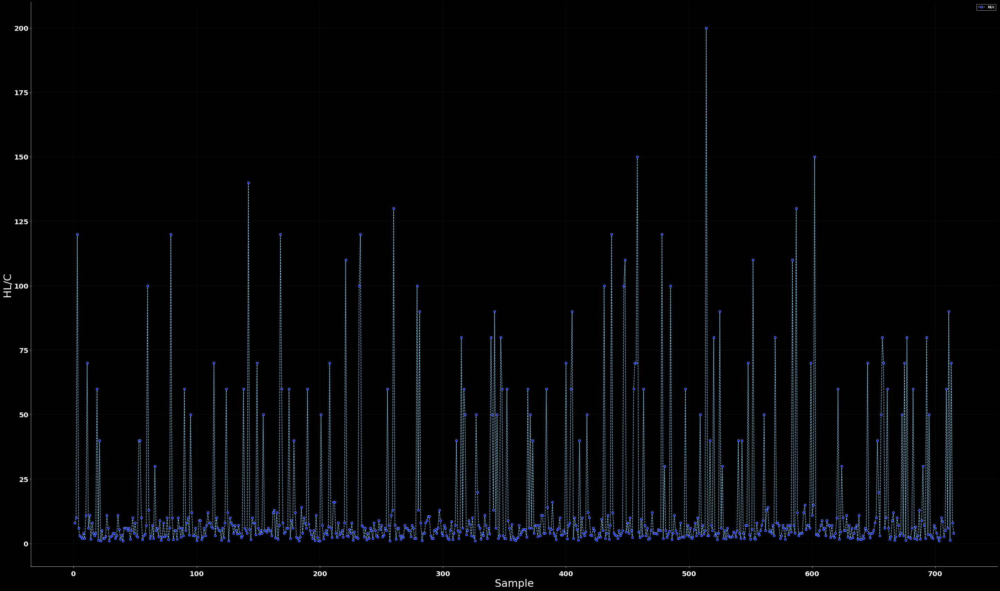

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:186: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

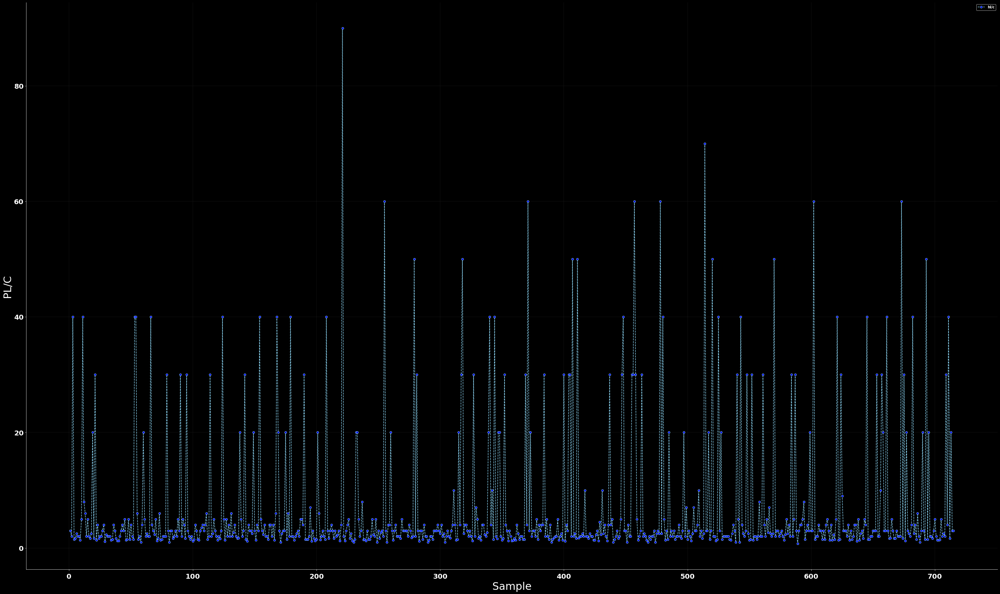

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:197: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

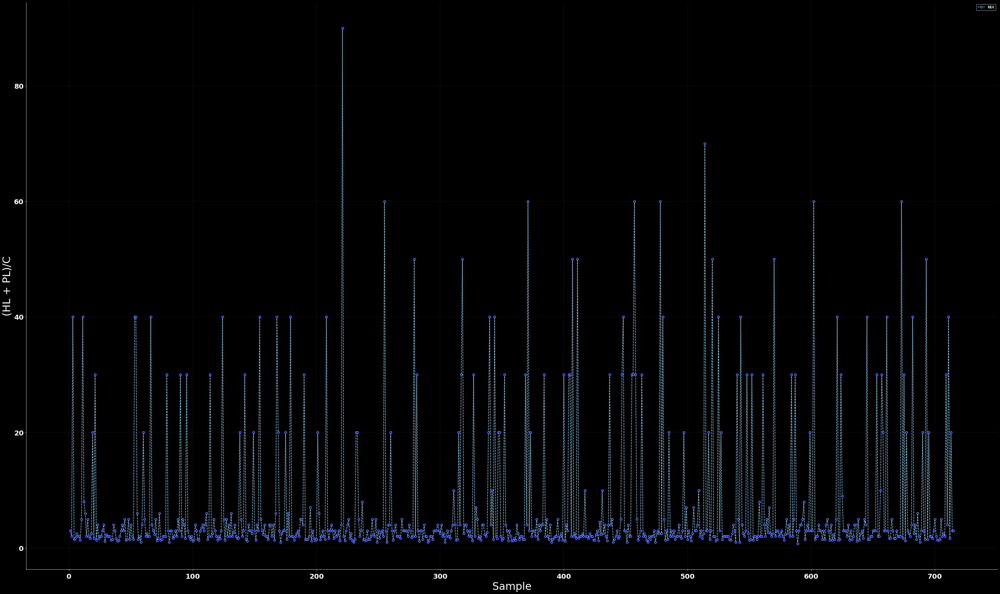

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:210: RuntimeWarning: Second argument 'y1' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

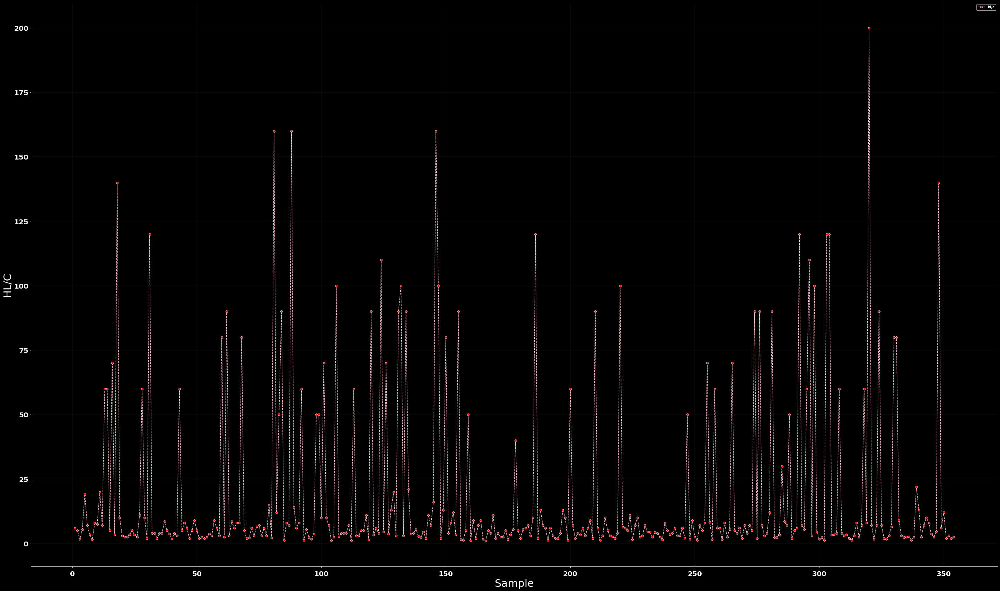

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:221: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

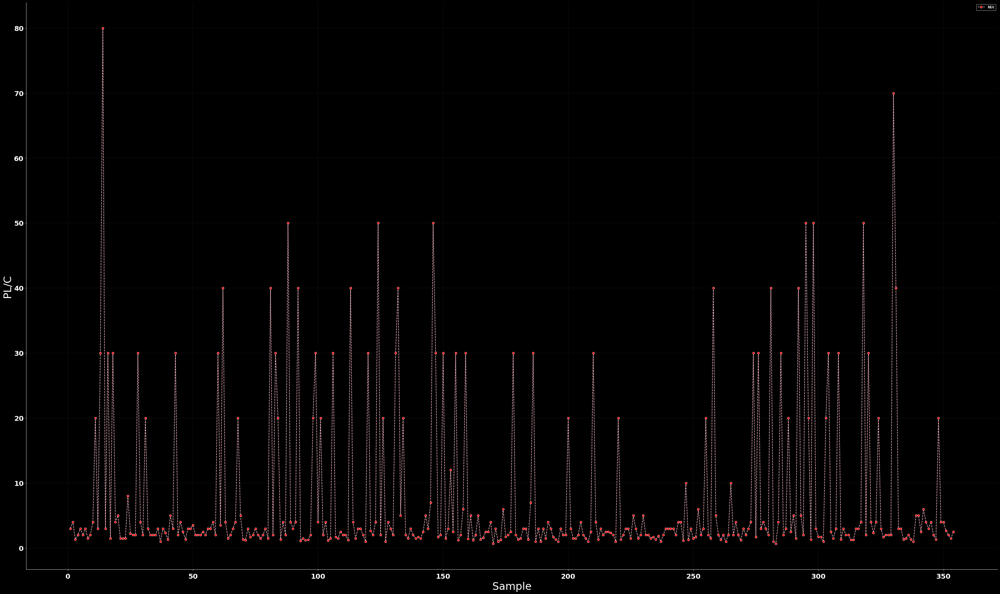

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:232: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

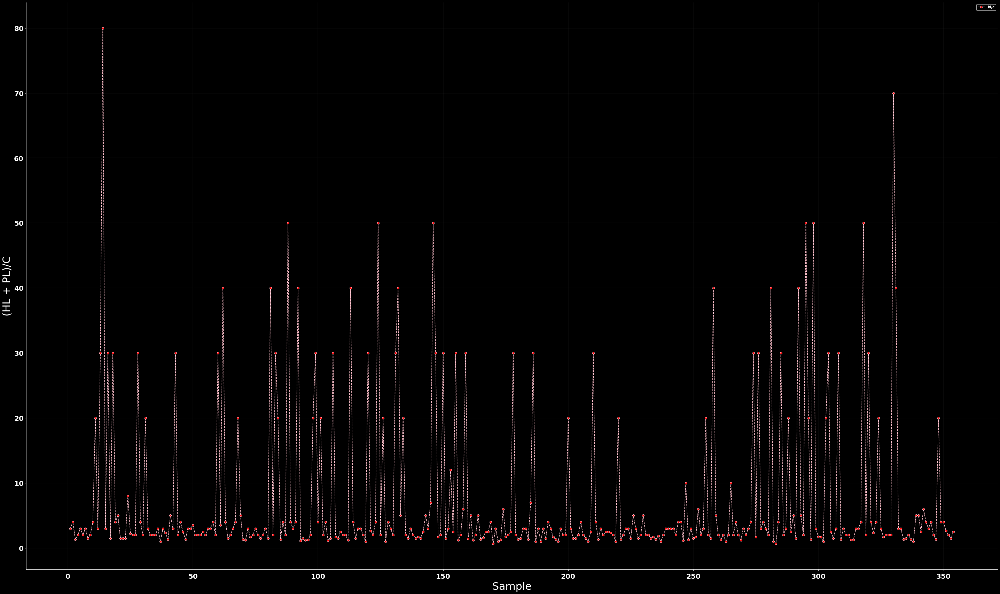

<Figure size 432x288 with 0 Axes>

In [270]:
#Word Overlap No Stop Words Good
def final(x):
    makeitastring = ' '.join(map(str, x))
    makeitastring=makeitastring.replace(",","")
    makeitastring=makeitastring.replace("'","")
    makeitastring=makeitastring.replace("[","")
    makeitastring=makeitastring.replace("]","")
    return makeitastring
c0=0
arr=[]
arr1=[]
arr2=[]
arr3=[]
x=int(len(gwords)/2)
for i in tqdm(range(x)):
    s=gwords.iloc[i]['final']
    s=s.lower()
    slist=s.split()
    slist = list(dict.fromkeys(slist))
    ss=gwords.iloc[i+x]['final']
    sslist=ss.split()
    sslist = list(dict.fromkeys(sslist))
    s=final(slist)
    ss=final(sslist)
    hl=len(slist)
    pl=len(sslist)
    slist=s.split()
    c=0
    for j in range(len(slist)):
         if(slist[j] in ss):
                c=c+1
    if(c==0):
        c0=c0+1
        c=c+0.1
    arr.append(c)
    arr1.append(hl/c)
    arr2.append(pl/c)
    arr3.append((hl+pl)/c)
xaxis=[]
e=[]
n=[]
c=[]
for i in range(0,int(max(arr))+1):
    xaxis.append(i)
    e.append(0)
    n.append(0)
    c.append(0)
for i in range(len(xaxis)):
    for j in range(len(arr)):
        if(math.floor(arr[j])==xaxis[i]):
            if(labelphg[j]=='entailment'):
                e[i]=e[i]+1
            elif(labelphg[j]=='neutral'):
                n[i]=n[i]+1
            else:
                c[i]=c[i]+1

from matplotlib import cm
from math import log10
labels = xaxis
data = e
nn = len(data)
k = 10 ** int(log10(max(data)))
m = k * (1 + max(data) // k)
plt.style.use('dark_background')
r = 1.5
w = r / nn
colors = [cm.RdYlGn(i / nn) for i in range(nn)]
fig, ax = plt.subplots(figsize=(5,5))
ax.axis("equal")
for i in range(nn):
    innerring, _ = ax.pie([m - data[i], data[i]], radius = r - i * w, startangle = 90, labels = ["", labels[i]], labeldistance = 1 - 1 / (1.5 * (nn - i)), textprops = {"alpha": 0}, colors = ["black", colors[i]])
    plt.setp(innerring, width = w, edgecolor = "white")
plt.show()
plt.clf()
from matplotlib import cm
from math import log10
labels = xaxis
data = n
nn = len(data)
k = 10 ** int(log10(max(data)))
m = k * (1 + max(data) // k)
plt.style.use('dark_background')
r = 1.5
w = r / nn
colors = [cm.RdYlGn(i / nn) for i in range(nn)]
fig, ax = plt.subplots(figsize=(5,5))
ax.axis("equal")
for i in range(nn):
    innerring, _ = ax.pie([m - data[i], data[i]], radius = r - i * w, startangle = 90, labels = ["", labels[i]], labeldistance = 1 - 1 / (1.5 * (nn - i)), textprops = {"alpha": 0}, colors = ["black", colors[i]])
    plt.setp(innerring, width = w, edgecolor = "white")
plt.show()
from matplotlib import cm
from math import log10
labels = xaxis
data = c
nn = len(data)
k = 10 ** int(log10(max(data)))
m = k * (1 + max(data) // k)
plt.style.use('dark_background')
r = 1.5
w = r / nn
colors = [cm.RdYlGn(i / nn) for i in range(nn)]
fig, ax = plt.subplots(figsize=(5,5))
ax.axis("equal")
for i in range(nn):
    innerring, _ = ax.pie([m - data[i], data[i]], radius = r - i * w, startangle = 90, labels = ["", labels[i]], labeldistance = 1 - 1 / (1.5 * (nn - i)), textprops = {"alpha": 0}, colors = ["black", colors[i]])
    plt.setp(innerring, width = w, edgecolor = "white")
plt.show()
e1=[]
e2=[]
e3=[]
n1=[]
n2=[]
n3=[]
c1=[]
c2=[]
c3=[]
for i in range(len(arr1)):
    if(labelphg[i]=='entailment'):
        e1.append(arr1[i])
        e2.append(arr2[i])
        e3.append(arr3[i])
    elif(labelphg[i]=='neutral'):
        n1.append(arr1[i])
        n2.append(arr2[i])
        n3.append(arr3[i])
    else:
        c1.append(arr1[i])
        c2.append(arr2[i])
        c3.append(arr3[i])

df=pd.DataFrame({'x': range(1,len(e1)+1), 'y1': e1, 'y2': e2, 'y3': e3 })
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('HL/C',fontsize=30)
ax.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='green' , color='olive',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('PL/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='green' , color='olive',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('(HL + PL)/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='green' , color='olive',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()

df=pd.DataFrame({'x': range(1,len(n1)+1), 'y1': n1, 'y2': n2, 'y3': n3 })
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('HL/C',fontsize=30)
ax.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='blue' , color='skyblue',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('PL/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='blue' , color='skyblue',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('(HL + PL)/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='blue' , color='skyblue',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()

df=pd.DataFrame({'x': range(1,len(c1)+1), 'y1': c1, 'y2': c2, 'y3': c3 })
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('HL/C',fontsize=30)
ax.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='red' , color='pink',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('PL/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='red' , color='pink',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('(HL + PL)/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='red' , color='pink',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()

good['onsc']=arr
good['onshc']=arr1
good['onspc']=arr2
good['onshpc']=arr3

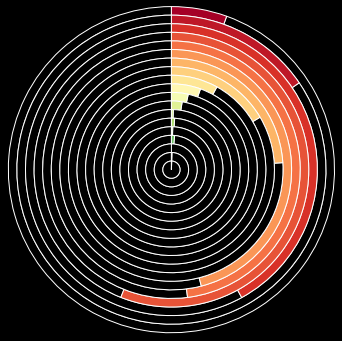

<Figure size 432x288 with 0 Axes>

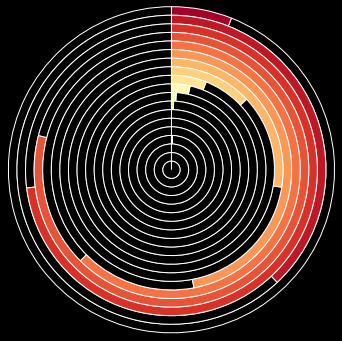

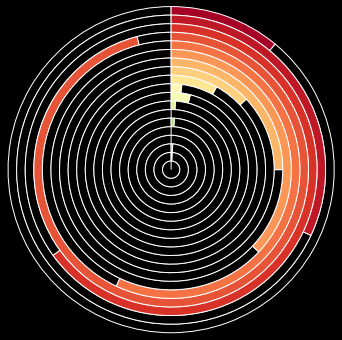

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:140: RuntimeWarning: Second argument 'y1' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


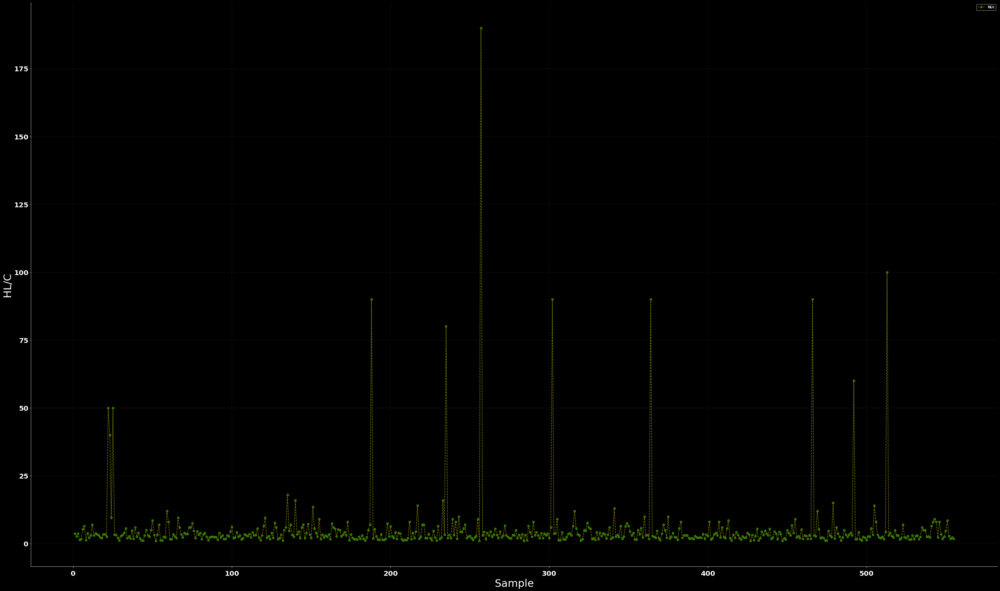

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:151: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

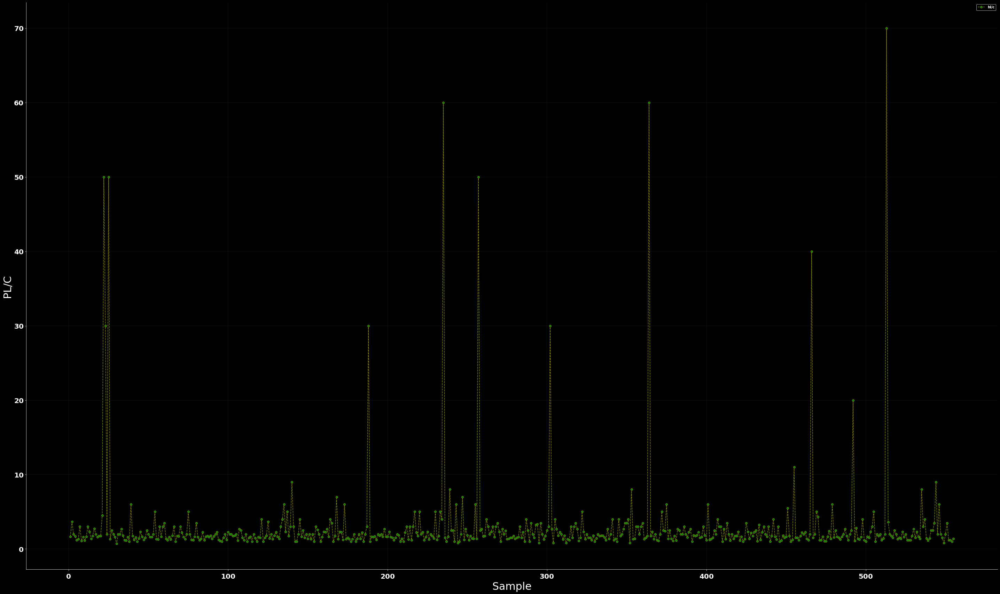

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:162: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

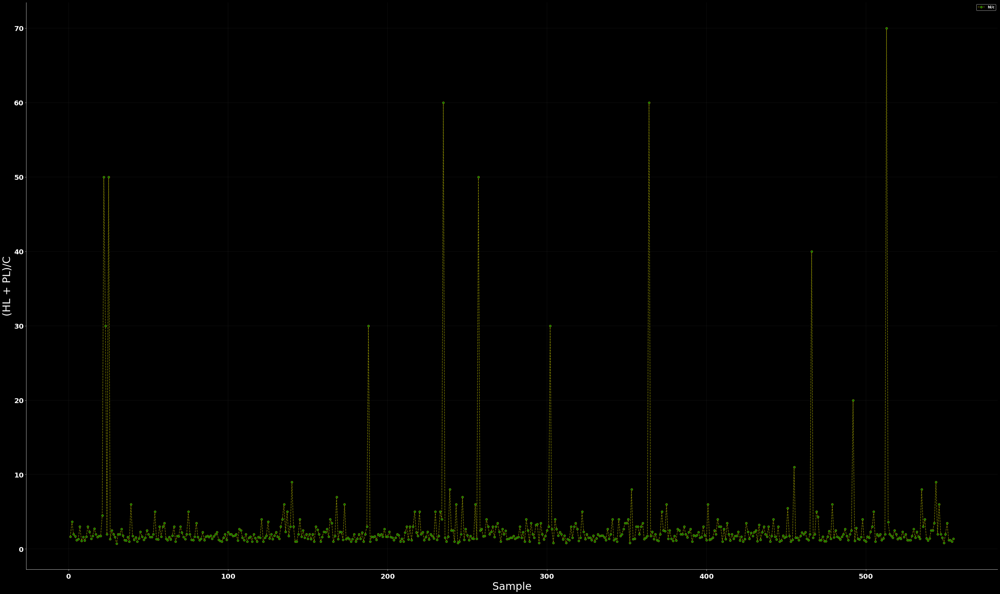

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:175: RuntimeWarning: Second argument 'y1' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

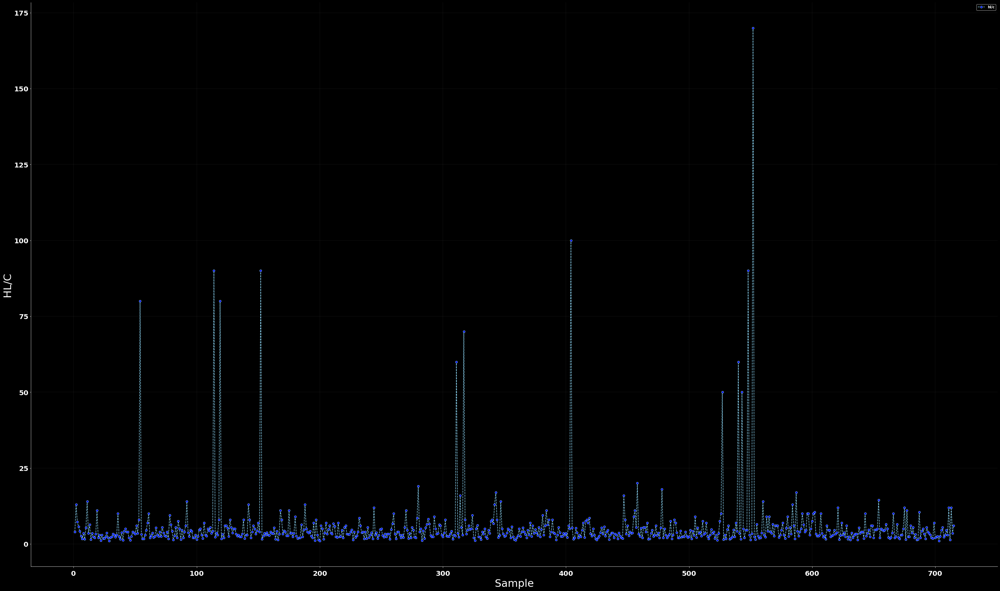

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:186: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

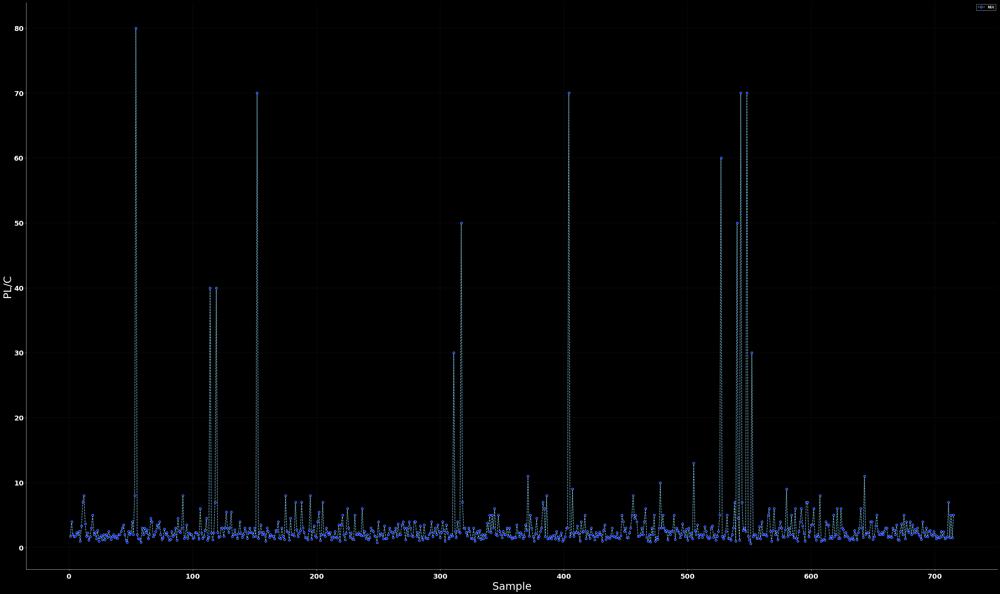

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:197: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

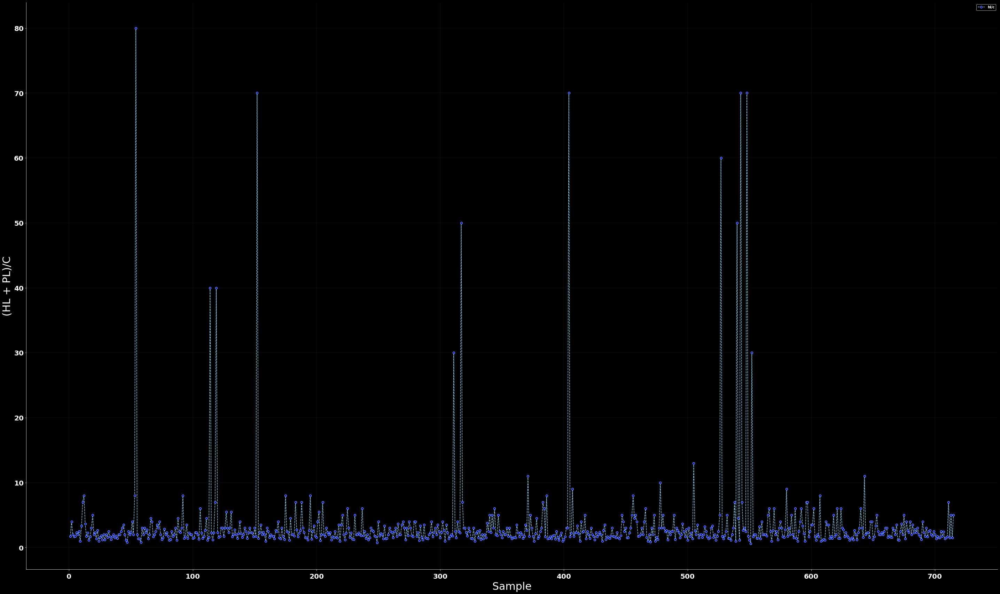

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:210: RuntimeWarning: Second argument 'y1' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

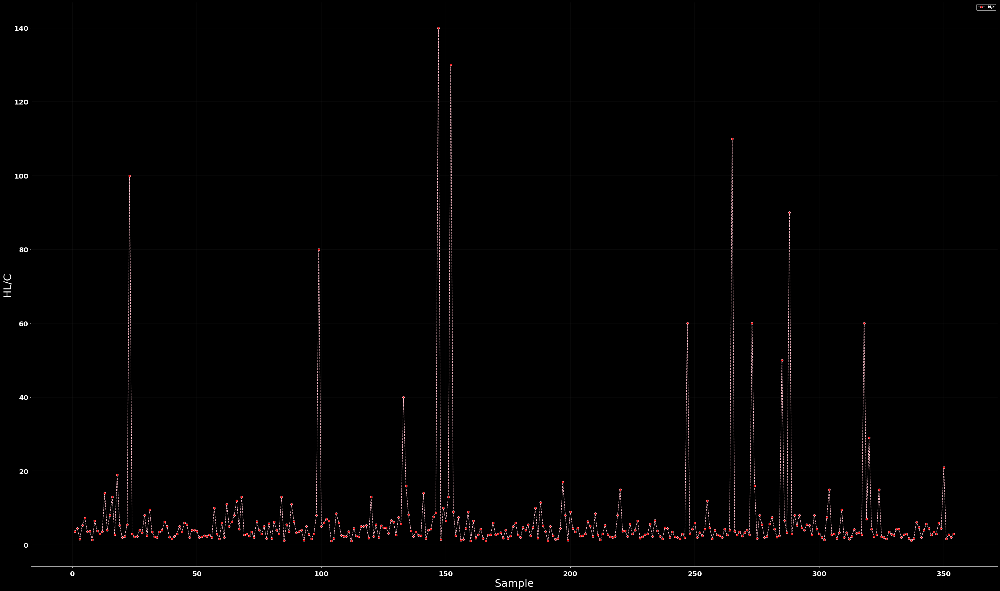

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:221: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

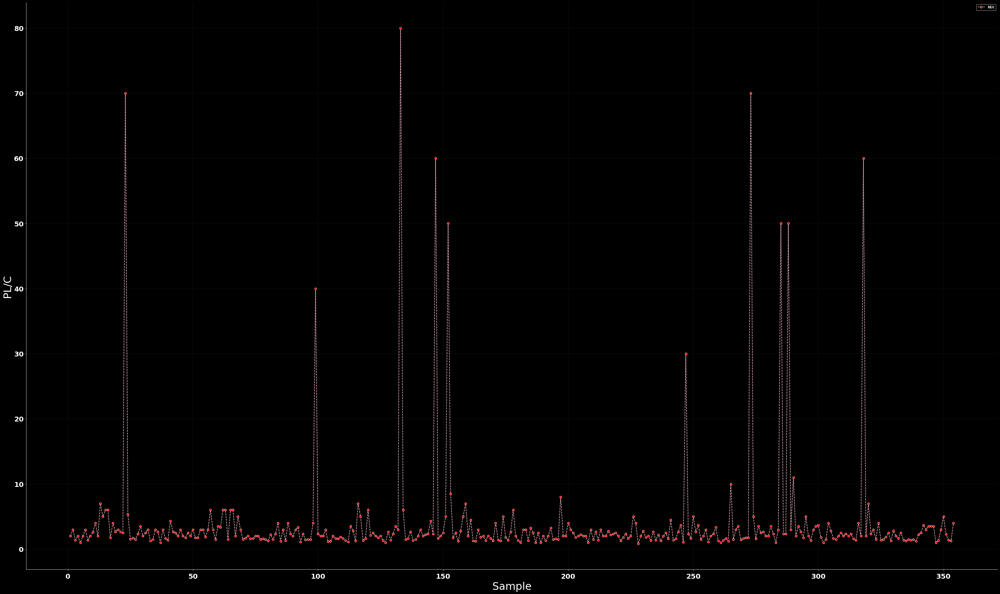

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:232: RuntimeWarning: Second argument 'y2' is ambiguous: could be a color spec but is in data; using as data.  Either rename the entry in data or use three arguments to plot.


<Figure size 432x288 with 0 Axes>

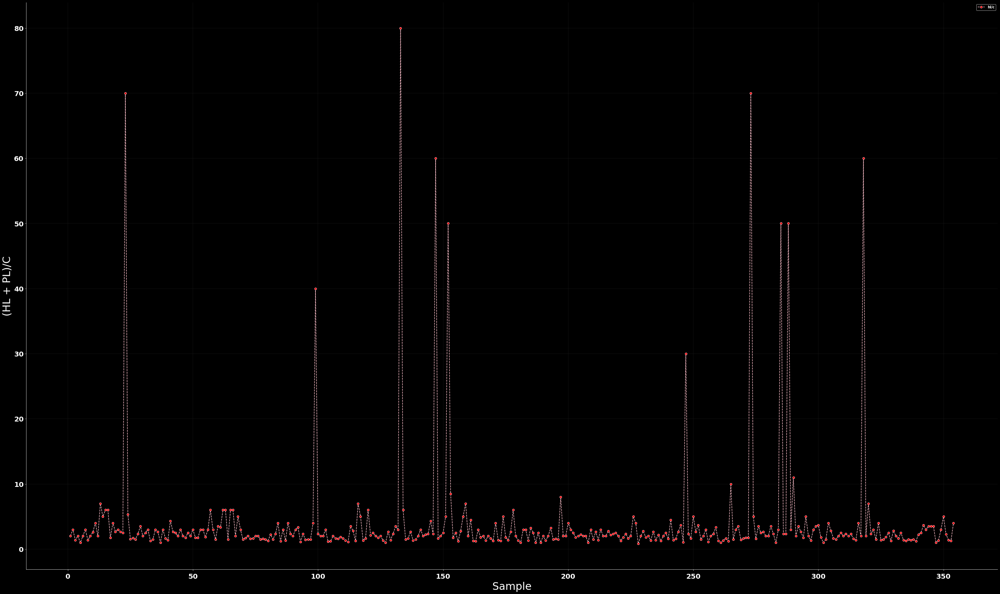

<Figure size 432x288 with 0 Axes>

In [271]:
#Word Overlap With Stop Words Good
def final(x):
    makeitastring = ' '.join(map(str, x))
    makeitastring=makeitastring.replace(",","")
    makeitastring=makeitastring.replace("'","")
    makeitastring=makeitastring.replace("[","")
    makeitastring=makeitastring.replace("]","")
    return makeitastring
c0=0
arr=[]
arr1=[]
arr2=[]
arr3=[]
x=int(len(gwords)/2)
for i in tqdm(range(x)):
    s=gwords.iloc[i]['fullnopunc']
    s=s.lower()
    slist=s.split()
    slist = list(dict.fromkeys(slist))
    ss=gwords.iloc[i+x]['fullnopunc']
    sslist=ss.split()
    sslist = list(dict.fromkeys(sslist))
    s=final(slist)
    ss=final(sslist)
    hl=len(slist)
    pl=len(sslist)
    slist=s.split()
    c=0
    for j in range(len(slist)):
         if(slist[j] in ss):
                c=c+1
    if(c==0):
        c0=c0+1
        c=c+0.1
    arr.append(c)
    arr1.append(hl/c)
    arr2.append(pl/c)
    arr3.append((hl+pl)/c)
xaxis=[]
e=[]
n=[]
c=[]
for i in range(0,int(max(arr))+1):
    xaxis.append(i)
    e.append(0)
    n.append(0)
    c.append(0)
for i in range(len(xaxis)):
    for j in range(len(arr)):
        if(math.floor(arr[j])==xaxis[i]):
            if(labelphg[j]=='entailment'):
                e[i]=e[i]+1
            elif(labelphg[j]=='neutral'):
                n[i]=n[i]+1
            else:
                c[i]=c[i]+1

from matplotlib import cm
from math import log10
labels = xaxis
data = e
nn = len(data)
k = 10 ** int(log10(max(data)))
m = k * (1 + max(data) // k)
plt.style.use('dark_background')
r = 1.5
w = r / nn
colors = [cm.RdYlGn(i / nn) for i in range(nn)]
fig, ax = plt.subplots(figsize=(5,5))
ax.axis("equal")
for i in range(nn):
    innerring, _ = ax.pie([m - data[i], data[i]], radius = r - i * w, startangle = 90, labels = ["", labels[i]], labeldistance = 1 - 1 / (1.5 * (nn - i)), textprops = {"alpha": 0}, colors = ["black", colors[i]])
    plt.setp(innerring, width = w, edgecolor = "white")
plt.show()
plt.clf()
from matplotlib import cm
from math import log10
labels = xaxis
data = n
nn = len(data)
k = 10 ** int(log10(max(data)))
m = k * (1 + max(data) // k)
plt.style.use('dark_background')
r = 1.5
w = r / nn
colors = [cm.RdYlGn(i / nn) for i in range(nn)]
fig, ax = plt.subplots(figsize=(5,5))
ax.axis("equal")
for i in range(nn):
    innerring, _ = ax.pie([m - data[i], data[i]], radius = r - i * w, startangle = 90, labels = ["", labels[i]], labeldistance = 1 - 1 / (1.5 * (nn - i)), textprops = {"alpha": 0}, colors = ["black", colors[i]])
    plt.setp(innerring, width = w, edgecolor = "white")
plt.show()
from matplotlib import cm
from math import log10
labels = xaxis
data = c
nn = len(data)
k = 10 ** int(log10(max(data)))
m = k * (1 + max(data) // k)
plt.style.use('dark_background')
r = 1.5
w = r / nn
colors = [cm.RdYlGn(i / nn) for i in range(nn)]
fig, ax = plt.subplots(figsize=(5,5))
ax.axis("equal")
for i in range(nn):
    innerring, _ = ax.pie([m - data[i], data[i]], radius = r - i * w, startangle = 90, labels = ["", labels[i]], labeldistance = 1 - 1 / (1.5 * (nn - i)), textprops = {"alpha": 0}, colors = ["black", colors[i]])
    plt.setp(innerring, width = w, edgecolor = "white")
plt.show()
e1=[]
e2=[]
e3=[]
n1=[]
n2=[]
n3=[]
c1=[]
c2=[]
c3=[]
for i in range(len(arr1)):
    if(labelphg[i]=='entailment'):
        e1.append(arr1[i])
        e2.append(arr2[i])
        e3.append(arr3[i])
    elif(labelphg[i]=='neutral'):
        n1.append(arr1[i])
        n2.append(arr2[i])
        n3.append(arr3[i])
    else:
        c1.append(arr1[i])
        c2.append(arr2[i])
        c3.append(arr3[i])

df=pd.DataFrame({'x': range(1,len(e1)+1), 'y1': e1, 'y2': e2, 'y3': e3 })
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('HL/C',fontsize=30)
ax.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='green' , color='olive',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('PL/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='green' , color='olive',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('(HL + PL)/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='green' , color='olive',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()

df=pd.DataFrame({'x': range(1,len(n1)+1), 'y1': n1, 'y2': n2, 'y3': n3 })
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('HL/C',fontsize=30)
ax.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='blue' , color='skyblue',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('PL/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='blue' , color='skyblue',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('(HL + PL)/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='blue' , color='skyblue',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()

df=pd.DataFrame({'x': range(1,len(c1)+1), 'y1': c1, 'y2': c2, 'y3': c3 })
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('HL/C',fontsize=30)
ax.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='red' , color='pink',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('PL/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='red' , color='pink',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()
fig, ax = plt.subplots(figsize=(50,30))
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel('Sample',fontsize=30)
ax.set_ylabel('(HL + PL)/C',fontsize=30)
ax.plot( 'x', 'y2', data=df, marker='o', markerfacecolor='red' , color='pink',linestyle='dashed', label="hl/c")
ax.tick_params(axis='both', which='major', labelsize=20)
plt.legend()
plt.show() 
plt.clf()

good['osc']=arr
good['oshc']=arr1
good['ospc']=arr2
good['oshpc']=arr3

In [275]:
good

,sample,p,h,lengthph,label,onsc,onshc,onspc,onshpc,osc,oshc,ospc,oshpc
0,0,This church choir sings to the masses as they ...,The church has cracks in the ceiling,11,neutral,1.0,8.000000,3.0,11.000000,4.0,4.000000,1.750000,5.750000
1,1,A woman with a green headscarf blue shirt and ...,The woman is very happy,8,entailment,1.0,7.000000,2.0,9.000000,3.0,3.666667,1.666667,5.333333
2,2,An old man with a package poses in front of an...,A man walks by an ad,6,contradiction,1.0,6.000000,3.0,9.000000,3.0,3.666667,2.000000,5.666667
3,3,A land rover is being driven across a river,A Land Rover is splashing water as it crosses ...,-2,entailment,3.0,1.666667,2.0,3.666667,3.0,2.666667,3.666667,6.333333
4,4,A blond-haired doctor and her African american...,A doctor is studying,9,neutral,1.0,10.000000,2.0,12.000000,1.0,13.000000,4.000000,17.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1619,1619,A older man in a hat is playing a accordion on...,A busker is wearing a hat,12,neutral,1.0,8.000000,3.0,11.000000,4.0,3.500000,1.500000,5.000000
1620,1620,A boy drags his sled through the snow,a boy drags his dog,3,contradiction,2.0,2.000000,1.5,3.500000,4.0,2.000000,1.250000,3.250000
1621,1621,A man wearing glasses and a ragged costume is ...,A man with glasses and a disheveled outfit is ...,4,entailment,6.0,2.000000,1.5,3.500000,10.0,1.800000,1.400000,3.200000
1622,1622,A female dancer wearing all white dancing whil...,A girl is dancing and anothe man take a photo,6,neutral,2.0,4.000000,3.0,7.000000,2.0,6.000000,5.000000,11.000000


In [276]:
#Word sim- w and w/o stop
#Similarity PH

In [277]:
nlp = spacy.load("en_trf_bertbaseuncased_lg")

In [278]:
def final(x):
    makeitastring = ' '.join(map(str, x))
    makeitastring=makeitastring.replace(",","")
    makeitastring=makeitastring.replace("'","")
    makeitastring=makeitastring.replace("[","")
    makeitastring=makeitastring.replace("]","")
    return makeitastring


x=int(len(gwords)/2)
arr1=[]
for i in tqdm(range(x)):
    s=gwords.iloc[i]['fullnopunc']
    s=s.lower()
    slist=s.split()
    sxlist = list(dict.fromkeys(slist))
    ss=gwords.iloc[i+x]['fullnopunc']
    sslist=ss.split()
    ssxlist = list(dict.fromkeys(sslist))
    sx=final(sxlist)
    ssx=final(ssxlist)
    sxlist=sx.split()
    hl=len(sxlist)
    pl=len(ssxlist)
    c=0
    for j in tqdm(range(len(sxlist))):
        arr=[]
        for k in range(len(ssxlist)):
            arr.append(nlp(sxlist[j]).similarity(nlp(ssxlist[k])))
        arr1.append(pd.Series(arr).max())


In [281]:
good

,sample,p,h,lengthph,label,onsc,onshc,onspc,onshpc,osc,oshc,ospc,oshpc
0,0,This church choir sings to the masses as they ...,The church has cracks in the ceiling,11,neutral,1.0,8.000000,3.0,11.000000,4.0,4.000000,1.750000,5.750000
1,1,A woman with a green headscarf blue shirt and ...,The woman is very happy,8,entailment,1.0,7.000000,2.0,9.000000,3.0,3.666667,1.666667,5.333333
2,2,An old man with a package poses in front of an...,A man walks by an ad,6,contradiction,1.0,6.000000,3.0,9.000000,3.0,3.666667,2.000000,5.666667
3,3,A land rover is being driven across a river,A Land Rover is splashing water as it crosses ...,-2,entailment,3.0,1.666667,2.0,3.666667,3.0,2.666667,3.666667,6.333333
4,4,A blond-haired doctor and her African american...,A doctor is studying,9,neutral,1.0,10.000000,2.0,12.000000,1.0,13.000000,4.000000,17.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1619,1619,A older man in a hat is playing a accordion on...,A busker is wearing a hat,12,neutral,1.0,8.000000,3.0,11.000000,4.0,3.500000,1.500000,5.000000
1620,1620,A boy drags his sled through the snow,a boy drags his dog,3,contradiction,2.0,2.000000,1.5,3.500000,4.0,2.000000,1.250000,3.250000
1621,1621,A man wearing glasses and a ragged costume is ...,A man with glasses and a disheveled outfit is ...,4,entailment,6.0,2.000000,1.5,3.500000,10.0,1.800000,1.400000,3.200000
1622,1622,A female dancer wearing all white dancing whil...,A girl is dancing and anothe man take a photo,6,neutral,2.0,4.000000,3.0,7.000000,2.0,6.000000,5.000000,11.000000


In [282]:
len(arr1)
wordmax=pd.DataFrame(arr1)
wordmax.to_csv('./wordmaxforeach.csv')

In [284]:
#PARAMETER 5
simarr=[]
df = pd.DataFrame(columns=['p', 'h'], data=df_testgood[['sentence1','sentence2']].values)
df['p'] = df['p'].str.replace("'", "")
df['p'] = df['p'].str.replace(".", "")
df['p'] = df['p'].str.replace(",", "")
df['h'] = df['h'].str.replace("'", "")
df['h'] = df['h'].str.replace(".", "")
df['h'] = df['h'].str.replace(",", "")

for i in tqdm(range(1624)):
    simarr.append((nlp(df.loc[i,'p'])).similarity(nlp(df.loc[i,'h'])))
print(simarr)


[0.5849144606185043, 0.6150955157484139, 0.8281041584728596, 0.9007215122279381, 0.6542154567670347, 0.6948498763644753, 0.7462948826597848, 0.7742689532359824, 0.8602436379622174, 0.7327029976454439, 0.7237184332111343, 0.7043618042233557, 0.9251547734497753, 0.8937507398499878, 0.8635429979780944, 0.6670678008733165, 0.8714525176735852, 0.6604886000241815, 0.6899037560620364, 0.6321272707285241, 0.8567939014109661, 0.6920164817598401, 0.6499453154000643, 0.8705256577842585, 0.7680633606134036, 0.7416081351031811, 0.7844598018613045, 0.8883807338944358, 0.8219497365039707, 0.8176855787978359, 0.6695097037398053, 0.6837613542087138, 0.8113442425380296, 0.6086586477754904, 0.8631590060412578, 0.8104352867424065, 0.8137884840282703, 0.740789570592515, 0.8524651074675985, 0.8782359824032847, 0.7477704772560809, 0.58424644381419, 0.8373315384317577, 0.8875614771755174, 0.6731051087971702, 0.770276277066505, 0.7940305976858382, 0.8771393275234044, 0.756941889029765, 0.7900560561476209, 0.7

In [285]:
good['sim']=simarr

In [286]:
good

,sample,p,h,lengthph,label,onsc,onshc,onspc,onshpc,osc,oshc,ospc,oshpc,sim
0,0,This church choir sings to the masses as they ...,The church has cracks in the ceiling,11,neutral,1.0,8.000000,3.0,11.000000,4.0,4.000000,1.750000,5.750000,0.584914
1,1,A woman with a green headscarf blue shirt and ...,The woman is very happy,8,entailment,1.0,7.000000,2.0,9.000000,3.0,3.666667,1.666667,5.333333,0.615096
2,2,An old man with a package poses in front of an...,A man walks by an ad,6,contradiction,1.0,6.000000,3.0,9.000000,3.0,3.666667,2.000000,5.666667,0.828104
3,3,A land rover is being driven across a river,A Land Rover is splashing water as it crosses ...,-2,entailment,3.0,1.666667,2.0,3.666667,3.0,2.666667,3.666667,6.333333,0.900722
4,4,A blond-haired doctor and her African american...,A doctor is studying,9,neutral,1.0,10.000000,2.0,12.000000,1.0,13.000000,4.000000,17.000000,0.654215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1619,1619,A older man in a hat is playing a accordion on...,A busker is wearing a hat,12,neutral,1.0,8.000000,3.0,11.000000,4.0,3.500000,1.500000,5.000000,0.873650
1620,1620,A boy drags his sled through the snow,a boy drags his dog,3,contradiction,2.0,2.000000,1.5,3.500000,4.0,2.000000,1.250000,3.250000,0.875585
1621,1621,A man wearing glasses and a ragged costume is ...,A man with glasses and a disheveled outfit is ...,4,entailment,6.0,2.000000,1.5,3.500000,10.0,1.800000,1.400000,3.200000,0.944667
1622,1622,A female dancer wearing all white dancing whil...,A girl is dancing and anothe man take a photo,6,neutral,2.0,4.000000,3.0,7.000000,2.0,6.000000,5.000000,11.000000,0.799079


In [287]:
good.to_csv('./testgoodefficacy.csv')

In [292]:
magwordsgs=gwords.final.str.split(expand=True).stack().value_counts()
magwordsg=gwords.fullnopunc.str.split(expand=True).stack().value_counts()

In [296]:
pd.DataFrame(magwordsg).to_csv('./wordswithstopgood.csv')

In [297]:
pd.DataFrame(magwordsgs).to_csv('./wordswithoutstopgood.csv')

In [304]:
tagged=nltk.pos_tag(magwordsgs.index)
tagged
tagged_reduced_adjective = set()
tagged_reduced_verbs = set()
tagged_reduced_adverbs = set()
tagged_reduced_nouns = set()
for speech_tag in tagged:
    if speech_tag[1] in ['JJ','JJR','JJS']:
        tagged_reduced_adjective.add(speech_tag[0])
    elif speech_tag[1] in ['RB','RBR','RBS']:
        tagged_reduced_adverbs.add(speech_tag[0])
    elif speech_tag[1] in ['VB','VBD','VBG','VBN','VBP','VBZ']:
        tagged_reduced_verbs.add(speech_tag[0])
    elif speech_tag[1] in ['NN','NNS','NNP','NNPS']:
        tagged_reduced_nouns.add(speech_tag[0])

In [305]:
wordposcount=[]

for i in range(len(magwordsgs)):
    wordposcount.append(0)

for i in range(len(magwordsgs)):
    if(magwordsgs.index[i] in tagged_reduced_adjective):
        wordposcount[i]=wordposcount[i]+1
    elif(magwordsgs.index[i] in tagged_reduced_adverbs):
        wordposcount[i]=wordposcount[i]+1
    elif(magwordsgs.index[i] in tagged_reduced_verbs):
        wordposcount[i]=wordposcount[i]+1
    elif(magwordsgs.index[i] in tagged_reduced_nouns):
        wordposcount[i]=wordposcount[i]+1

In [306]:
df=pd.DataFrame(columns=['word','homonym'])
df['word']=magwordsgs.index
df['homonym']=wordposcount
df

,word,homonym
0,man,1
1,woman,1
2,two,0
3,people,1
4,wearing,1
...,...,...
3080,pinstriped,1
3081,handhold,1
3082,dumpster,1
3083,heat,1


In [307]:
for i in range(len(df)):
    if(df.iloc[i]['homonym']>1):
        print(df.iloc[i]['word'])

In [311]:
prepositions=['about', 'after', 'at', 'before', 'behind', 'by', 'during', 'for', 'from', 'in', 'of', 'over', 'past', 'to', 'under', 'up', 'with']
for i in range(len(magwordsg)):
    if(magwordsg.index[i] in prepositions):
        print(magwordsg.index[i],magwordsg[i]/len(df_testgood))

in 0.7850985221674877
of 0.3866995073891626
with 0.3472906403940887
to 0.2555418719211823
at 0.1933497536945813
for 0.09298029556650246
up 0.06157635467980296
by 0.0603448275862069
from 0.04064039408866995
over 0.03694581280788178
behind 0.02401477832512315
about 0.022783251231527094
under 0.009852216748768473
past 0.008620689655172414
after 0.008004926108374385
before 0.0049261083743842365
during 0.003694581280788177


In [312]:
print(tagged_reduced_adverbs)

{'oven', 'flashcard', 'entryway', 'really', 'playfully', 'ther', 'fence', 'away', 'mountainside', 'chest', 'also', 'somewhere', 'more', 'frantically', 'apparatus', 'cover', 'trough', 'broadway', 'latex', 'dispenser', 'directly', 'recently', 'toast', 'onward', 'colorfully', 'slightly', 'lighten', 'partially', 'swell', 'around', 'primarily', 'later', 'almost', 'again!', 'traditionally', 'probably', 'far', 'freshly', 'intently', 'brightly', 'eyesight', 'raven', 'strangely', 'happily', 'siege', 'ahead', 'else', 'joyfully', 'well', 'smelly', 'score', 'looter', 'actually', 'whiteboard', 'even', 'currently', 'walkway', 'fairly', 'overly', 'here', 'gently', 'thoroughly', 'newly', 'tore', 'indeed', 'yard', 'assembly', 'shabbily', 'finally', 'teacher', 'quickly', 'casually', 'vigarously', 'back', 'semi-formally', 'dimly', 'feather', 'sooner', 'suicide', 'patiently', 'mug', 'trolley', 'leprechaun', 'enter', 'still', 'forward', 'highly', 'already', 'ago', 'visually', 'leotard', 'eachother', 'count

In [313]:
for i in range(len(magwordsg)):
    if(magwordsg.index[i] in ['and','or']):
        print(magwordsg.index[i],magwordsg[i]/len(df_testgood))

and 0.43103448275862066
or 0.011699507389162561


In [314]:
for i in range(len(magwordsg)):
    if(magwordsg.index[i] in ['the','a','this','that','it']):
        print(magwordsg.index[i],magwordsg[i]/len(df_testgood))

a 1.7764778325123152
the 0.7629310344827587
that 0.03879310344827586
it 0.024630541871921183
this 0.0012315270935960591


In [316]:
len(tagged_reduced_adjective)/len(df_testgood)

0.3947044334975369